# Kartlegging
https://github.com/statisticsnorway/ssb-sgis

Åpne heller notebooken her: https://nbviewer.org/github/statisticsnorway/intro_til_geopandas/blob/main/kartlegging.ipynb

In [1]:
# midlrertidig pga noen lokale endringer i pakka
import os
while "ssb-sgis" not in os.listdir():
    os.chdir("..")
os.chdir("ssb-sgis/src")
os.listdir()

['sgis']

In [2]:
import geopandas as gpd
import pandas as pd
import numpy as np
import sgis as sg

Henter bygningsdata som skal kartlegges.

In [3]:
aar = 2022

bygningspunktsti = f"ssb-prod-kart-data-delt/kartdata_analyse/klargjorte-data/{aar}/SMAT_bygg_punkt_p{aar}_v1.parquet"

bygg = sg.read_geopandas(
    bygningspunktsti,
    filters=[("KOMMUNENR", "in", ('0301','3401'))],
    columns=["KOMMUNENR", "BYGTYPE", "AREAL_E2", "DATOMERGE", "geometry"]
)

bygg["aar"] = bygg.DATOMERGE.map(lambda x: int(x[:4].replace(" ", "0")))

bygg

,KOMMUNENR,BYGTYPE,AREAL_E2,DATOMERGE,geometry,aar
2295777,0301,111,112.0,19871001,POINT (266589.000 6638437.000),1987
2295778,0301,133,60.0,19990827,POINT (266732.000 6638437.000),1999
2295785,0301,181,33.0,,POINT (268985.000 6638438.000),0
2295807,0301,111,95.0,19010101,POINT (268630.000 6638490.000),1901
2295816,0301,181,27.0,19971015,POINT (266745.000 6638491.000),1997
...,...,...,...,...,...,...
2829598,3401,249,49.0,,POINT (334172.000 6694149.000),0
2829599,3401,249,49.0,,POINT (334187.000 6694149.000),0
2829613,3401,181,33.0,,POINT (337419.000 6694152.000),0
2829620,3401,181,39.0,19971125,POINT (333568.000 6694153.000),1997


Lager noen eksempelsirkler.

In [4]:
noen_bygg1 = bygg.loc[bygg.KOMMUNENR == "0301"].sample(50).pipe(sg.buff, 150)
noen_bygg2 = bygg.loc[bygg.KOMMUNENR == "0301"].sample(50).pipe(sg.buff, 300)
noen_bygg3 = bygg.loc[bygg.KOMMUNENR == "0301"].sample(50).pipe(sg.buff, 450)

Kartlegg tre GeoDataFrames med geopandas.explore:

In [5]:
pd.concat(
    [
        noen_bygg1.assign(hva="noen_bygg1"),
        noen_bygg2.assign(hva="noen_bygg2"),
        noen_bygg3.assign(hva="noen_bygg3"),
    ]
).explore("hva")

Alternativ: sgis.explore.

In [6]:
sg.explore(noen_bygg3, noen_bygg2, noen_bygg1)

Med kolonne:

In [7]:
sg.explore(noen_bygg3, noen_bygg2, noen_bygg1, "area")

Hvis dataene, som her, er for tunge til å vises samtidig: sgis.samplemap og sgis.clipmap.

Legger til vegdata.

In [8]:
kartdata = "ssb-prod-kart-data-delt/kartdata_analyse/klargjorte-data"

veger = sg.read_geopandas(
    f"{kartdata}/2022/NVDB_ruteplan_nettverk_p20220703_v1.parquet",
    filters=[("KOMMUNENR", "in", ('0301', '3024', '3020'))]
     )

veger = veger[["oneway", "drivetime_fw", "drivetime_bw", "roadid", "KOMMUNENR", "geometry"]]

veger

,oneway,drivetime_fw,drivetime_bw,roadid,KOMMUNENR,geometry
119702,B,0.216611,0.216611,{S944},0301,MULTILINESTRING Z ((258028.440 6674249.890 413...
189106,B,0.087743,0.087743,{P99633},3020,MULTILINESTRING Z ((267535.900 6626904.300 125...
189109,B,0.124622,0.124622,{P5300},3020,MULTILINESTRING Z ((267234.416 6629037.819 140...
189277,B,0.107511,0.107511,{K6100},3020,MULTILINESTRING Z ((271502.710 6620482.300 157...
189278,B,0.057101,0.057101,{K6100},3020,MULTILINESTRING Z ((271476.937 6620508.594 154...
...,...,...,...,...,...,...
1944347,B,0.175876,0.175876,{P91422},0301,MULTILINESTRING Z ((260762.830 6650240.620 43....
1948011,B,0.111139,0.111139,{P2050},3020,MULTILINESTRING Z ((266108.070 6626317.900 130...
1948017,B,0.136247,0.136247,{P4900},3020,MULTILINESTRING Z ((267013.150 6627652.210 151...
1948023,B,0.108602,0.108602,{P4900},3020,MULTILINESTRING Z ((267013.150 6627652.210 151...


Og kartlegger et tilfeldig område.

In [9]:
sg.samplemap(veger, bygg)

Kartlegg utvalgt område.

In [10]:
bygdoy = sg.to_gdf([10.6812329, 59.9069741], crs=4326).to_crs(25833)
sg.clipmap(veger, bygg, mask=bygdoy.buffer(1250))

## Statisk kartlegging

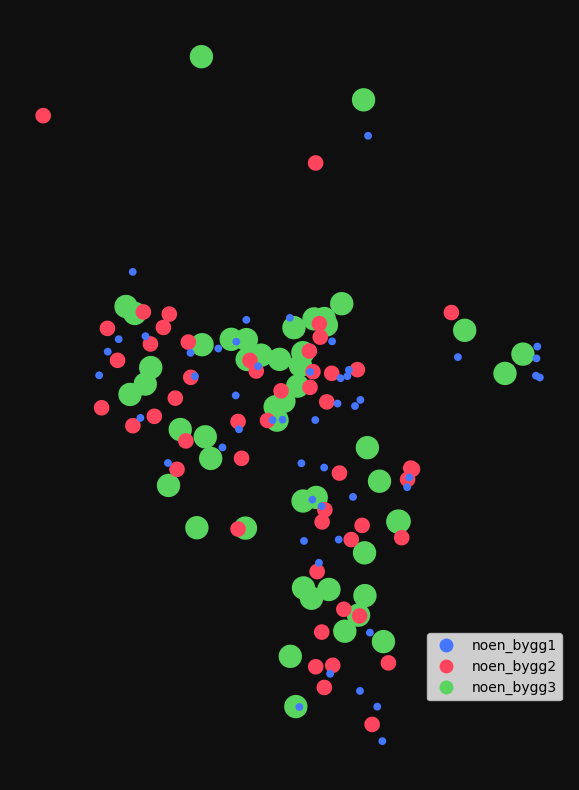

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [11]:
sg.qtm(noen_bygg3, noen_bygg2, noen_bygg1)

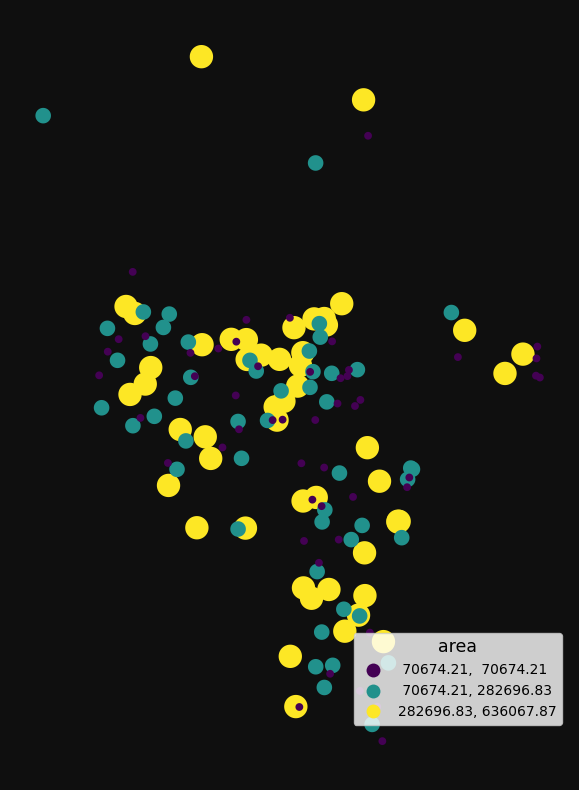

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [12]:
sg.qtm(noen_bygg3, noen_bygg2, noen_bygg1, "area")